In [1]:
import os
import random
import warnings
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download("wordnet")
nltk.download("punkt_tab")

warnings.filterwarnings("ignore", message=".*copying from a non-meta parameter.*")
warnings.filterwarnings(
    "ignore", message=".*The key `labels` is will return integer ids*"
)

device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.mps.is_available() else "cpu"
)
print(device)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

lemmatizer = WordNetLemmatizer()

2025-04-27 14:16:29.113342: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745763389.299545      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745763389.352416      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


cuda


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [2]:
class FoggyCityscapesDataset(Dataset):
    def __init__(self, root, annotations_path, processor):
        self.root = root
        self.coco_annotations = COCO(annotations_path)
        self.processor = processor
        self.img_ids = list(self.coco_annotations.imgs.keys())
        self.img_to_path = {
            id: os.path.join(root, self.coco_annotations.loadImgs(id)[0]["file_name"])
            for id in self.img_ids
        }

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        image_id = self.img_ids[idx]
        path = self.img_to_path[image_id]
        image = np.array(Image.open(path).convert("RGB"))
        processed = {}
        processed["image_id"] = image_id
        processed["orig_image"] = image
        processed["processed_img"] = self.processor(
            images=np.array(image), return_tensors="pt"
        )["pixel_values"].squeeze(0)

        return processed

In [3]:
def plot_predictions(orig_image, gt, output, id_to_cat):
    orig_image_cpu = orig_image.detach().cpu()

    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    axs[0].imshow(orig_image_cpu)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(orig_image_cpu)
    axs[1].set_title("Ground Truth Boxes")
    axs[1].axis("off")
    for label, box in zip(gt["labels"], gt["boxes"]):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="green",
            facecolor="none",
        )
        axs[1].add_patch(rect)
        axs[1].text(
            xmin,
            ymin - 5,
            f"GT: {id_to_cat[label]}",
            fontsize=10,
            color="blue",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    axs[2].imshow(orig_image)
    axs[2].set_title("Predicted Boxes")
    axs[2].axis("off")

    for score, label, box in zip(output["scores"], output["labels"], output["boxes"]):
        score = score.detach().cpu()
        label = label.detach().cpu()
        box = box.detach().cpu()

        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        axs[2].add_patch(rect)
        axs[2].text(
            xmin,
            ymin - 5,
            f"{id_to_cat[label.item()]}: {round(score.item(), 2)}",
            fontsize=10,
            color="red",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    plt.tight_layout()
    plt.show()

In [4]:
def map_predictions(predictions, label_map):
    new_scores = []
    new_boxes = []
    new_labels = []

    for score, box, text_label in zip(
        predictions["scores"], predictions["boxes"], predictions["text_labels"]
    ):
        tokens = word_tokenize(text_label.lower())
        label_added = set()

        for token in tokens:
            lemma = lemmatizer.lemmatize(token)
            if lemma in label_map and lemma not in label_added:
                label_added.add(lemma)
                new_scores.append(score)
                new_boxes.append(box)
                new_labels.append(label_map[lemma])

    if len(new_scores) != 0:
        predictions["scores"] = torch.stack(new_scores)
        predictions["boxes"] = torch.stack(new_boxes)
        predictions["labels"] = torch.tensor(new_labels)
    else:
        predictions["scores"] = torch.empty(0)
        predictions["boxes"] = torch.empty((0, 4))
        predictions["labels"] = torch.empty(0)

    return predictions

In [5]:
def summarise_and_plot_metrics(coco, coco_dt, save_dir):
    coco_eval = COCOeval(coco, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()

    os.makedirs(save_dir, exist_ok=True)

    print("\n### COCO Evaluation Summary ###")
    coco_eval.summarize()

    overall_metrics = {
        "AP@[IoU=0.50:0.95]": coco_eval.stats[0],
        "AP@0.50": coco_eval.stats[1],
        "AP@0.75": coco_eval.stats[2],
        "AP (small)": coco_eval.stats[3],
        "AP (medium)": coco_eval.stats[4],
        "AP (large)": coco_eval.stats[5],
        "AR@1": coco_eval.stats[6],
        "AR@10": coco_eval.stats[7],
        "AR@100": coco_eval.stats[8],
        "AR (small)": coco_eval.stats[9],
        "AR (medium)": coco_eval.stats[10],
        "AR (large)": coco_eval.stats[11],
    }

    print("\n### Overall COCO Evaluation Metrics ###")
    for metric, value in overall_metrics.items():
        print(f"{metric:20s}: {value:.3f}")

    pd.DataFrame([overall_metrics]).to_csv(
        os.path.join(save_dir, "overall_metrics.csv"), index=False
    )

    precisions = coco_eval.eval["precision"]
    recall_vals = coco_eval.params.recThrs
    cat_ids = coco.getCatIds()

    full_metrics = []
    all_pr_tables = []
    overall_pr = []

    print("\n### Per-Class AP Metrics ###")
    for idx, catId in enumerate(cat_ids):
        class_metrics = {}
        cat_name = coco.loadCats(catId)[0]["name"]
        class_metrics["category"] = cat_name

        p50 = precisions[0, :, idx, 0, 2]
        p50 = p50[p50 > -1]
        class_metrics["AP@0.50"] = np.mean(p50) if p50.size else float("nan")

        p75 = precisions[5, :, idx, 0, 2]
        p75 = p75[p75 > -1]
        class_metrics["AP@0.75"] = np.mean(p75) if p75.size else float("nan")

        p_all = precisions[:, :, idx, 0, 2]
        p_all = p_all[p_all > -1]
        class_metrics["mAP@[.5:.95]"] = np.mean(p_all) if p_all.size else float("nan")

        full_metrics.append(class_metrics)

        print(
            f"{cat_name:20s} | AP@0.5: {class_metrics['AP@0.50']:.3f} | "
            f"AP@0.75: {class_metrics['AP@0.75']:.3f} | "
            f"mAP@[.5:.95]: {class_metrics['mAP@[.5:.95]']:.3f}"
        )

        pr_curve = precisions[0, :, idx, 0, 2]
        if np.any(pr_curve > -1):
            overall_pr.append(np.where(pr_curve == -1, 0, pr_curve))

        # Collect PR table data
        for r, p in zip(recall_vals, pr_curve):
            if p > -1:
                all_pr_tables.append(
                    {"category": cat_name, "recall": r, "precision": p}
                )

        # Plot PR curve for this class
        valid = pr_curve > -1
        plt.figure()
        plt.plot(
            recall_vals[valid],
            pr_curve[valid],
            label=f"PR Curve - {cat_name}",
            color="blue",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"PR Curve @ IoU=0.5 for {cat_name}")
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, f"pr_curve_{cat_name.replace(' ', '_')}.png")
        )
        plt.show()
        plt.close()

    # Save per-class metrics
    df_metrics = pd.DataFrame(full_metrics)
    df_metrics.to_csv(os.path.join(save_dir, "per_class_metrics.csv"), index=False)

    # Plot mAP per class bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(df_metrics["category"], df_metrics["mAP@[.5:.95]"], color="skyblue")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("mAP@[.5:.95]")
    plt.title("Mean Average Precision per Class")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "mAP_per_class.png"))
    plt.show()
    plt.close()

    # Save full precision-recall table to CSV
    pr_df = pd.DataFrame(all_pr_tables)
    pr_df.to_csv(os.path.join(save_dir, "precision_recall_table.csv"), index=False)

    # Overall PR Curve
    if overall_pr:
        overall_pr_array = np.array(overall_pr)
        mean_pr_curve = np.mean(overall_pr_array, axis=0)

        # Plot overall PR curve
        plt.figure(figsize=(8, 6))
        plt.plot(
            recall_vals,
            mean_pr_curve,
            color="darkorange",
            label="Overall PR Curve (IoU=0.5)",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Overall Precision-Recall Curve @ IoU=0.5")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, "overall_pr_curve.png"))
        plt.show()
        plt.close()

        # Plot PR curves for all classes in one figure
        plt.figure(figsize=(10, 7))
        for idx, pr_curve in enumerate(overall_pr_array):
            cat_name = coco.loadCats(cat_ids[idx])[0]["name"]
            valid = pr_curve > -1
            plt.plot(recall_vals[valid], pr_curve[valid], label=cat_name, linewidth=1.5)
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("PR Curves for All Classes @ IoU=0.5")
        plt.legend(
            loc="best", fontsize="small", bbox_to_anchor=(1.05, 1), borderaxespad=0.0
        )
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, "all_classes_pr_curve.png"), bbox_inches="tight"
        )
        plt.show()
        plt.close()

    # Plot AP@0.50 and AP@0.75 side-by-side per class
    plt.figure(figsize=(14, 6))
    x = np.arange(len(df_metrics))
    width = 0.35

    plt.bar(
        x - width / 2, df_metrics["AP@0.50"], width, label="AP@0.50", color="lightgreen"
    )
    plt.bar(
        x + width / 2, df_metrics["AP@0.75"], width, label="AP@0.75", color="salmon"
    )

    plt.xticks(ticks=x, labels=df_metrics["category"], rotation=45, ha="right")
    plt.ylabel("Average Precision")
    plt.title("AP@0.50 vs AP@0.75 per Class")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP50_vs_AP75_per_class.png"))
    plt.show()
    plt.close()

    # Object-size AP bar chart
    size_ap_labels = ["small", "medium", "large"]
    size_ap_values = [
        overall_metrics["AP (small)"],
        overall_metrics["AP (medium)"],
        overall_metrics["AP (large)"],
    ]

    plt.figure(figsize=(6, 5))
    plt.bar(size_ap_labels, size_ap_values, color="orchid")
    plt.title("AP by Object Size")
    plt.ylabel("Average Precision")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP_by_object_size.png"))
    plt.show()
    plt.close()

    maxDets = ["AR@1", "AR@10", "AR@100"]
    ar_values = [
        overall_metrics["AR@1"],
        overall_metrics["AR@10"],
        overall_metrics["AR@100"],
    ]

    plt.figure(figsize=(6, 5))
    plt.plot(maxDets, ar_values, marker="o", linestyle="-", color="dodgerblue")
    plt.title("Average Recall vs Max Detections")
    plt.ylabel("Average Recall")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AR_vs_max_detections.png"))
    plt.show()
    plt.close()

    print("\n### Overall PR Curves at Multiple IoU Thresholds ###")

    iou_thresholds = coco_eval.params.iouThrs
    all_pr_curves = []

    plt.figure(figsize=(10, 6))

    for i, iou in enumerate(iou_thresholds):
        pr_iou = precisions[i, :, :, 0, 2]
        pr_iou = np.where(pr_iou == -1, 0, pr_iou)
        mean_pr = np.mean(pr_iou, axis=1)

        all_pr_curves.append(mean_pr)
        plt.plot(recall_vals, mean_pr, label=f"IoU={iou:.2f}", linewidth=1.5)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Overall PR Curves @ Varying IoU Thresholds")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "pr_curves_multiple_ious.png"))
    plt.show()
    plt.close()

In [6]:
def inference(model, dataloader, processor, id_to_cat, save_path):
    coco = dataloader.dataset.coco_annotations

    cat_to_id = {}
    for k, v in id_to_cat.items():
        cat_to_id[v] = k

    coco_predictions = []
    visualize = True
    num_visualize = 4
    num_visualize_done = 0

    prompt = "person.car.train.rider.truck.motorcycle.bicycle.bus."

    for batch in tqdm(dataloader, desc="Running inference"):
        processed_images = batch["processed_img"].to(device)
        orig_images = batch["orig_image"]
        image_ids = batch["image_id"]

        batch_size = orig_images.shape[0]
        prompt_enc = processor.tokenizer([prompt] * batch_size, return_tensors="pt")
        prompt_enc = prompt_enc.to(device)

        pre_outputs = model(
            pixel_values=processed_images, input_ids=prompt_enc["input_ids"]
        )

        postprocessed_outputs = processor.post_process_grounded_object_detection(
            pre_outputs,
            target_sizes=torch.tensor(
                [img.shape[:2] for img in orig_images], device=pre_outputs.logits.device
            ),
            # threshold=0.05,
        )

        for i, image_id in enumerate(image_ids):
            output = postprocessed_outputs[i]

            output = map_predictions(output, cat_to_id)

            for score, label, box in zip(
                output["scores"], output["labels"], output["boxes"]
            ):
                coco_predictions.append(
                    {
                        "image_id": int(image_id),
                        "category_id": int(label),
                        "bbox": [
                            float(box[0]),
                            float(box[1]),
                            float(box[2] - box[0]),
                            float(box[3] - box[1]),
                        ],
                        "score": float(score),
                    }
                )

            if visualize and num_visualize_done < num_visualize:
                num_visualize_done += 1
                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                if not gt_annotations:
                    continue

                gt_labels = [ann["category_id"] for ann in gt_annotations]
                gt_boxes = [
                    [
                        ann["bbox"][0],
                        ann["bbox"][1],
                        ann["bbox"][0] + ann["bbox"][2],
                        ann["bbox"][1] + ann["bbox"][3],
                    ]
                    for ann in gt_annotations
                ]
                gt = {"labels": gt_labels, "boxes": gt_boxes}

                plot_predictions(orig_images[i], gt, output, id_to_cat)

    with open(save_path, "w") as f:
        json.dump(coco_predictions, f)

In [7]:
processor = AutoProcessor.from_pretrained("IDEA-Research/grounding-dino-base")
model = AutoModelForZeroShotObjectDetection.from_pretrained(
    "IDEA-Research/grounding-dino-base"
)
model = model.to(device)

preprocessor_config.json:   0%|          | 0.00/457 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.74k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/933M [00:00<?, ?B/s]

In [8]:
train_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_train",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_train.json",
    processor=processor,
)

val_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_val",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_val.json",
    processor=processor,
)

loading annotations into memory...
Done (t=12.69s)
creating index...
index created!
loading annotations into memory...
Done (t=3.07s)
creating index...
index created!


In [9]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

In [10]:
train_coco_gt = train_dataset.coco_annotations
val_coco_gt = val_dataset.coco_annotations
valid_cat_ids = set(val_coco_gt.getCatIds())
categories = val_coco_gt.loadCats(valid_cat_ids)
id_to_cat = {cat["id"]: cat["name"] for cat in categories}


--- Evaluating on training set ---


Running inference:   0%|          | 0/297 [00:00<?, ?it/s]

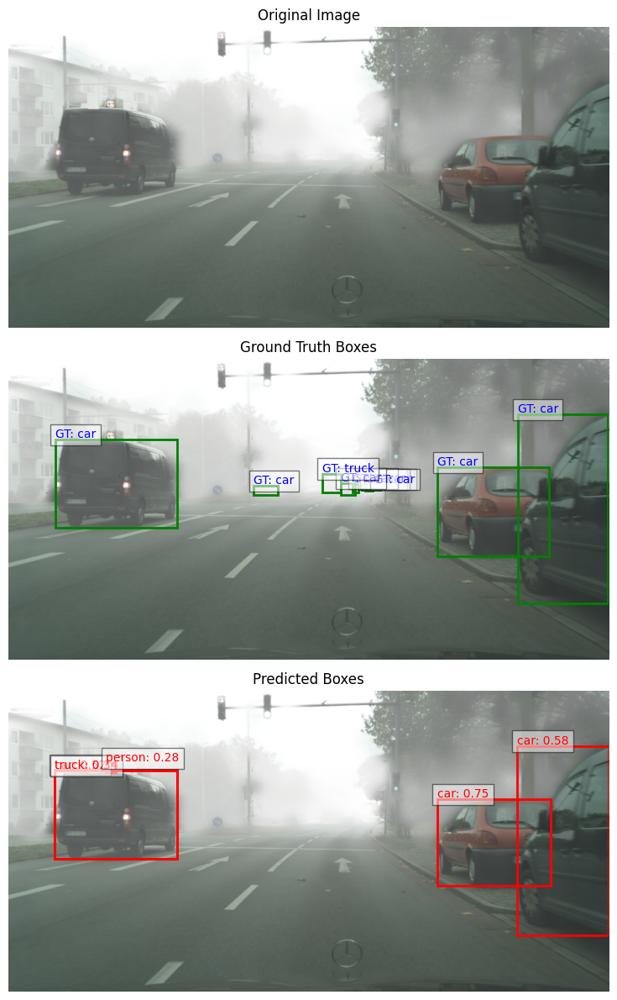

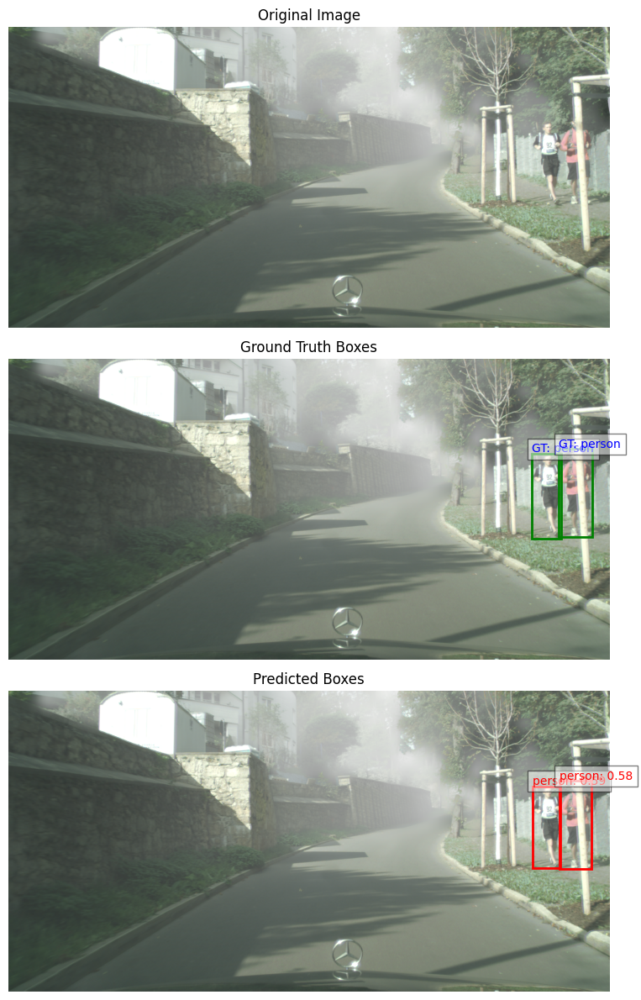

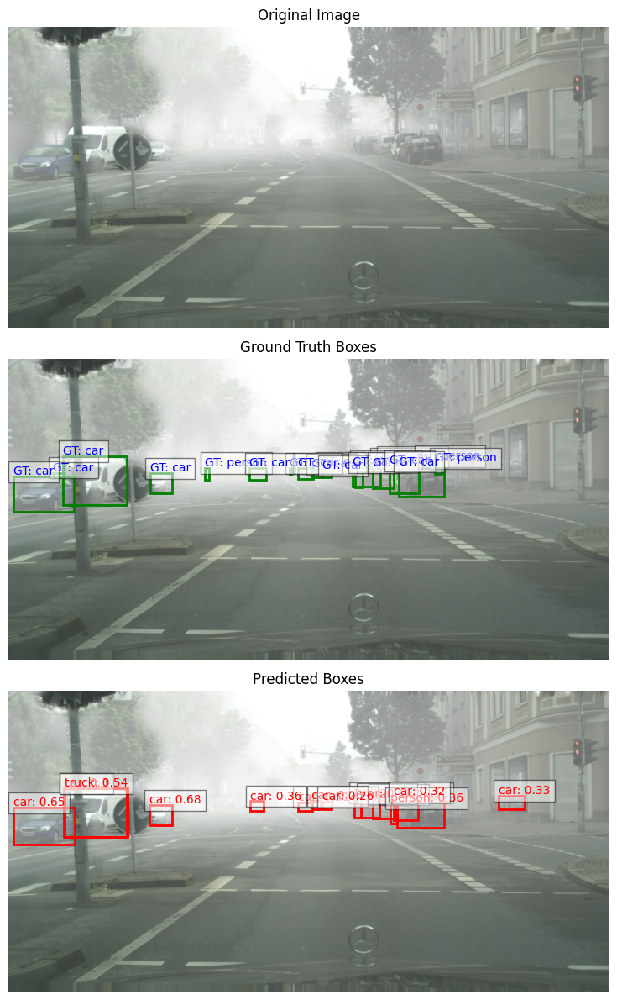

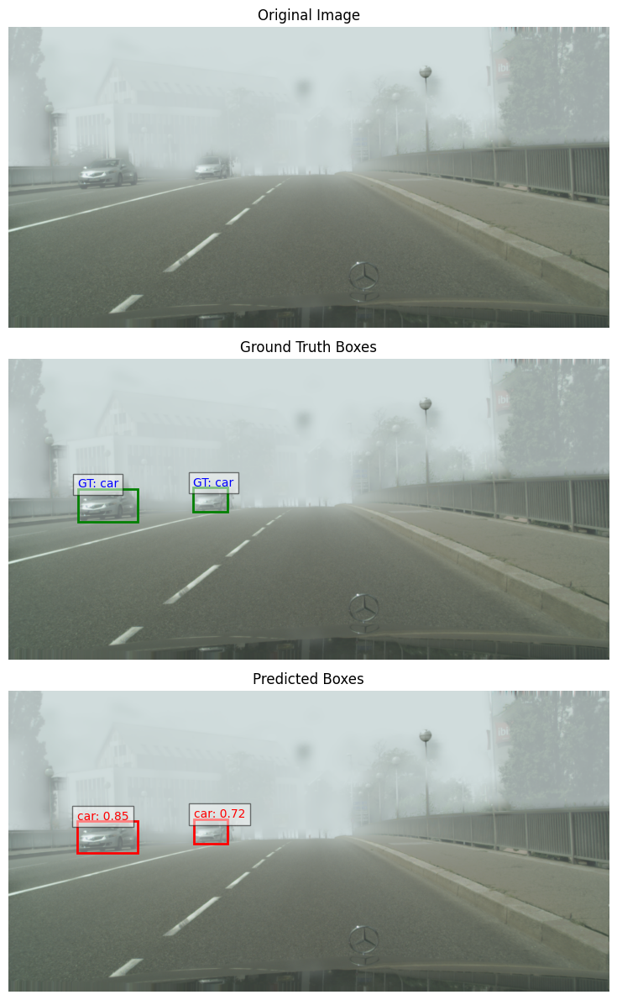

Running inference: 100%|██████████| 297/297 [21:16<00:00,  4.30s/it]


In [11]:
print("\n--- Evaluating on training set ---")
train_save_path = "train_predictions.json"
model.eval()
with torch.no_grad():
    train_eval = inference(model, train_loader, processor, id_to_cat, train_save_path)

Loading and preparing results...
DONE (t=0.96s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=7.13s).
Accumulating evaluation results...
DONE (t=0.75s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.195
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.529
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.204
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.329
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.335
 Average Recall     (AR) @[ IoU=0.5

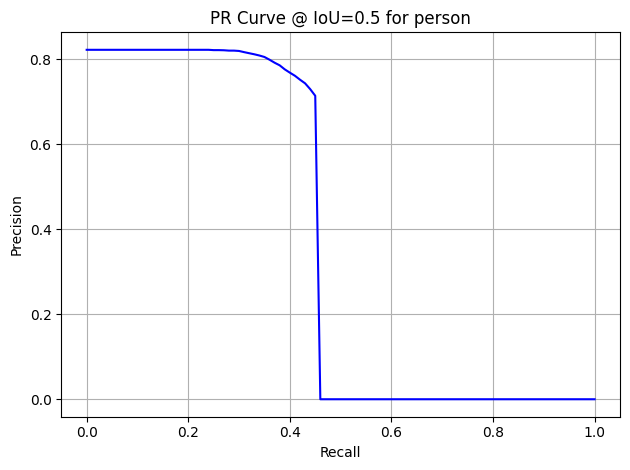

car                  | AP@0.5: 0.513 | AP@0.75: 0.432 | mAP@[.5:.95]: 0.387


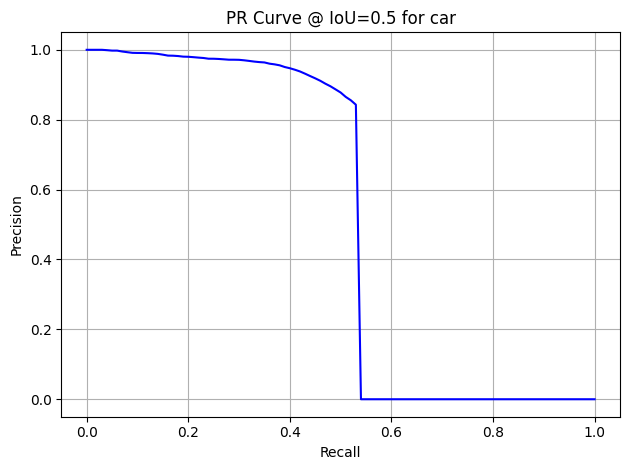

train                | AP@0.5: 0.316 | AP@0.75: 0.214 | mAP@[.5:.95]: 0.231


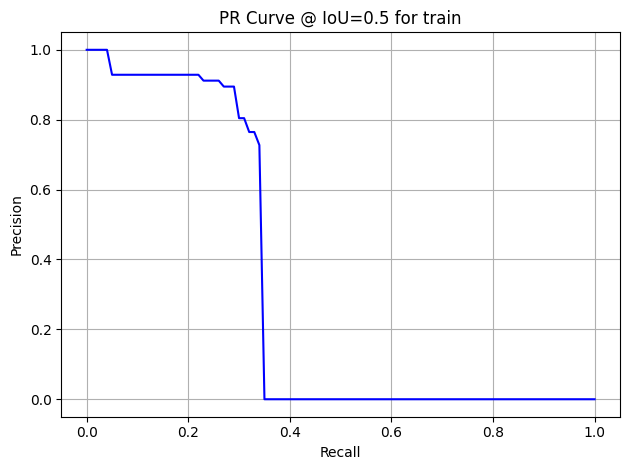

rider                | AP@0.5: 0.177 | AP@0.75: 0.140 | mAP@[.5:.95]: 0.123


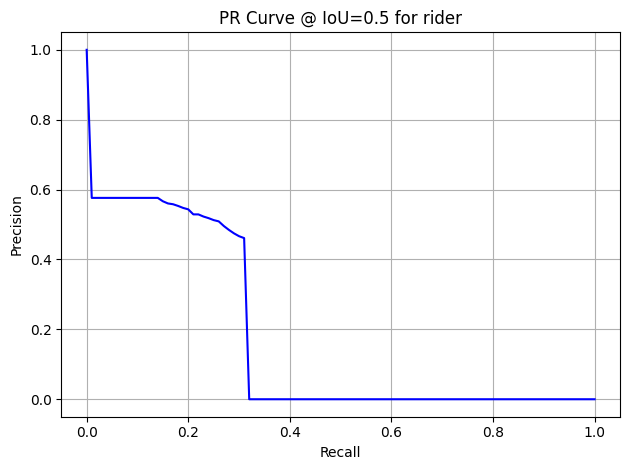

truck                | AP@0.5: 0.234 | AP@0.75: 0.212 | mAP@[.5:.95]: 0.195


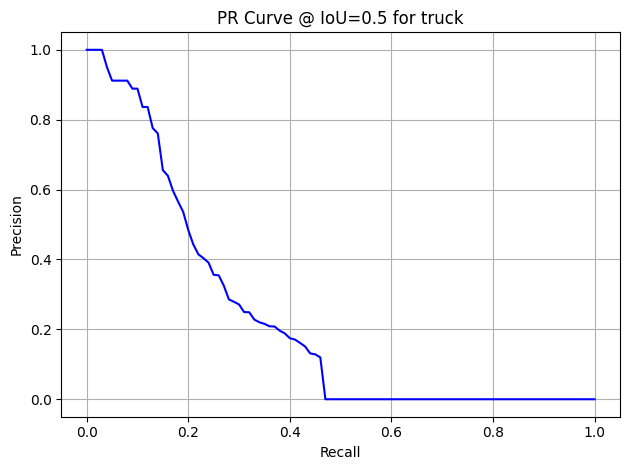

motorcycle           | AP@0.5: 0.346 | AP@0.75: 0.173 | mAP@[.5:.95]: 0.189


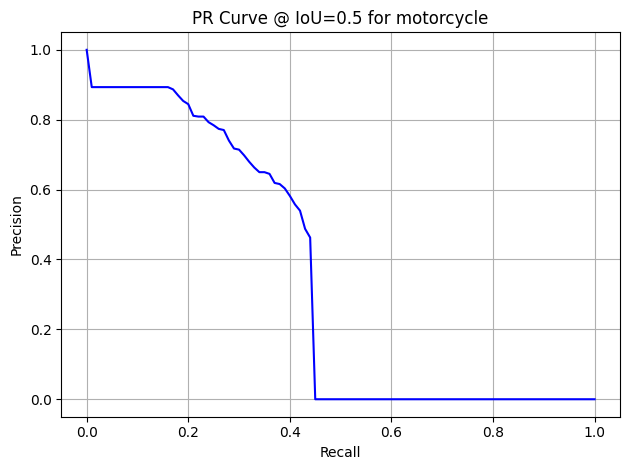

bicycle              | AP@0.5: 0.362 | AP@0.75: 0.199 | mAP@[.5:.95]: 0.204


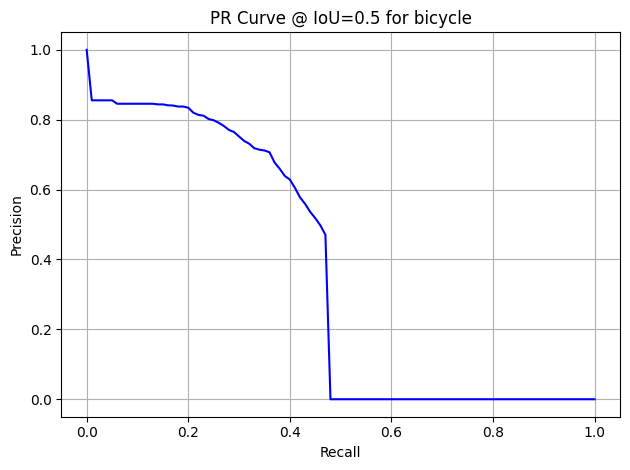

bus                  | AP@0.5: 0.423 | AP@0.75: 0.403 | mAP@[.5:.95]: 0.362


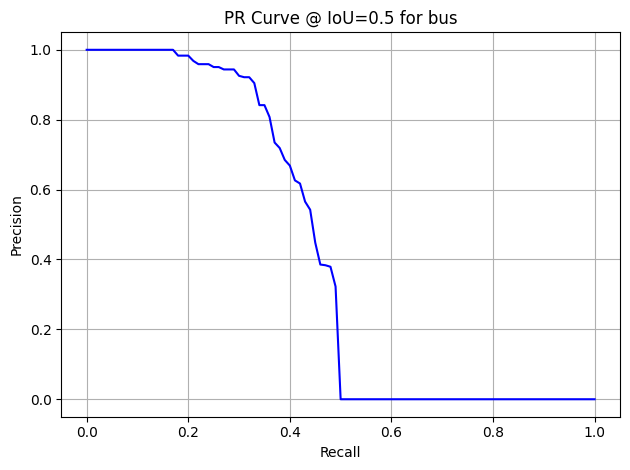

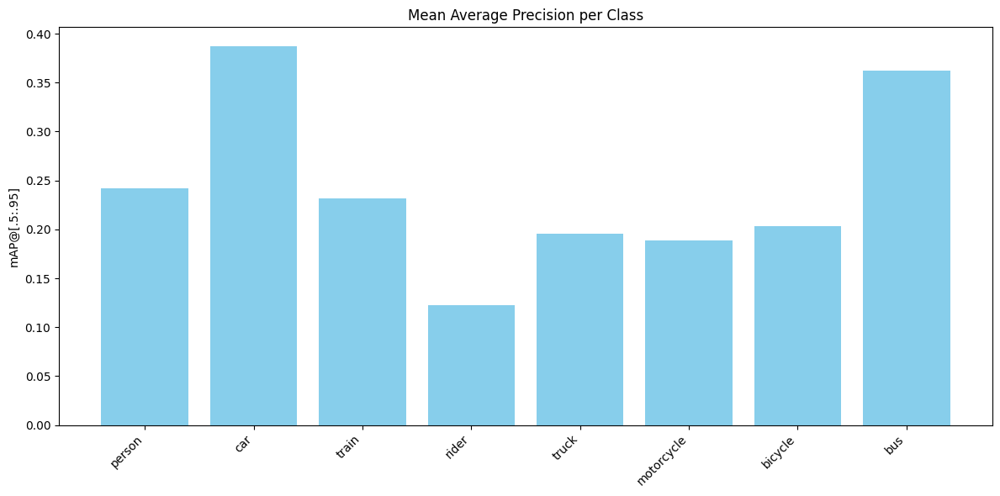

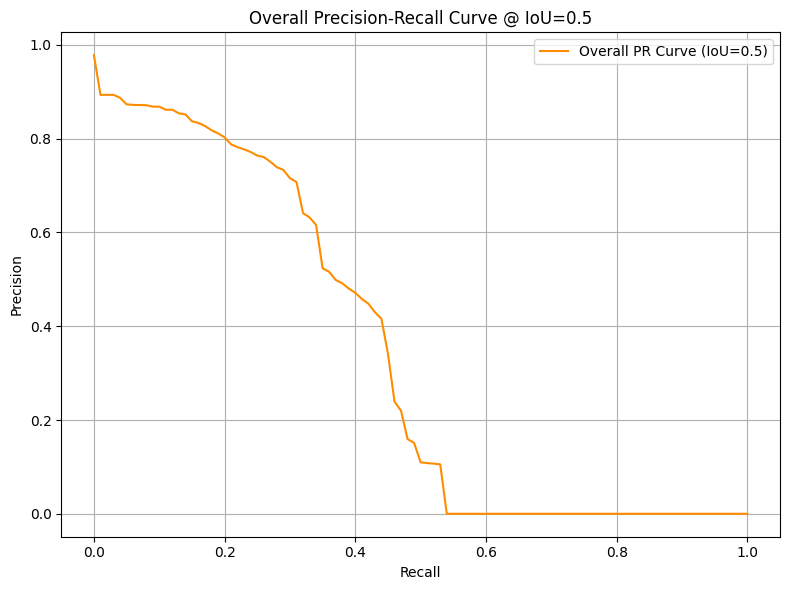

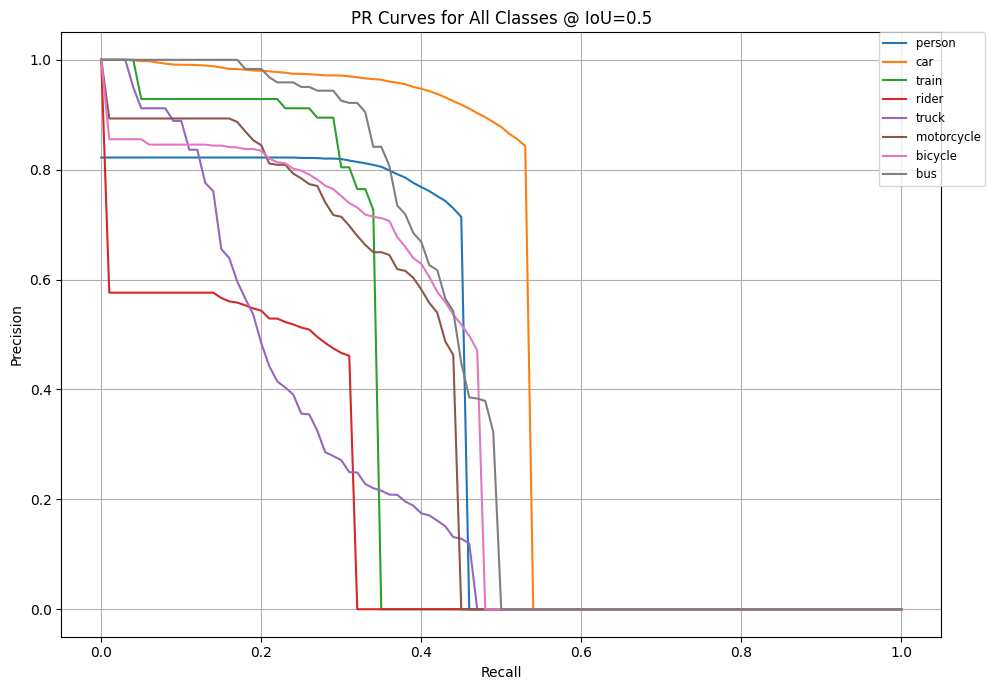

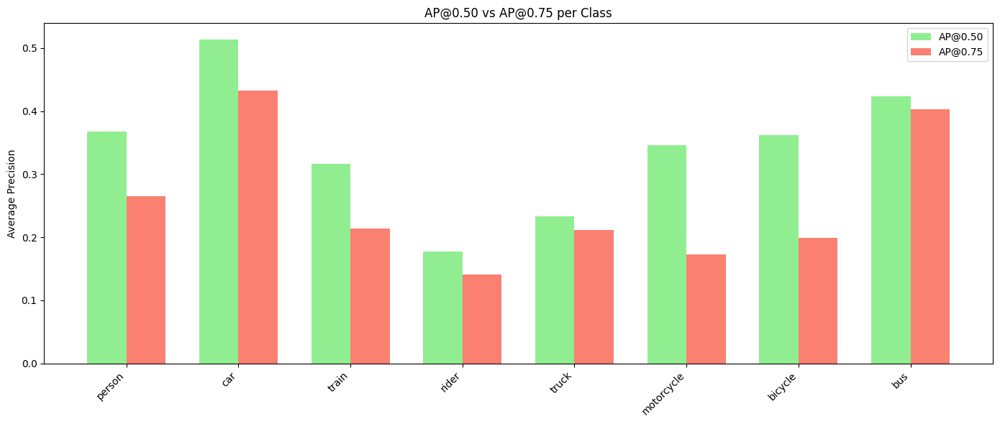

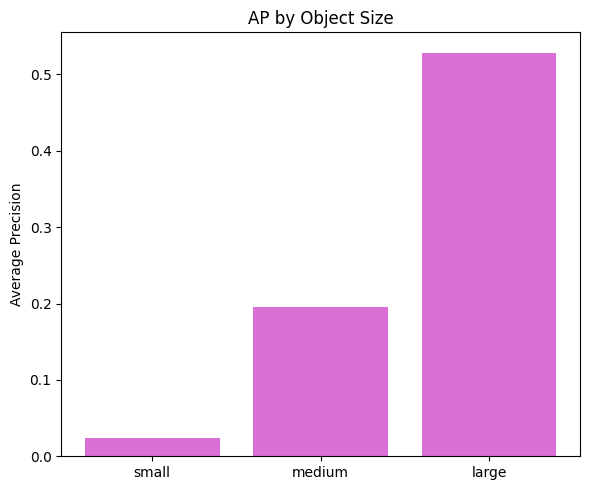

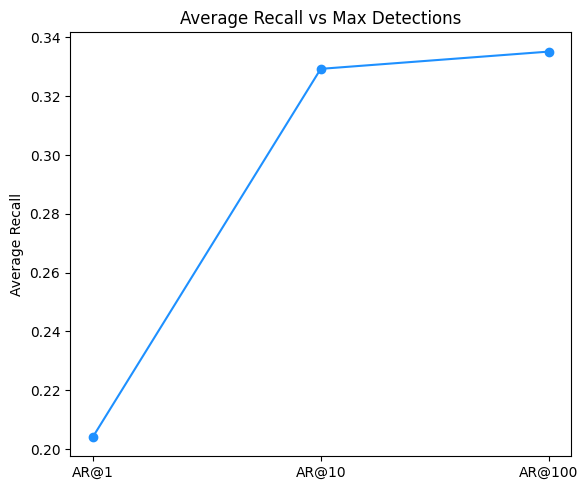


### Overall PR Curves at Multiple IoU Thresholds ###


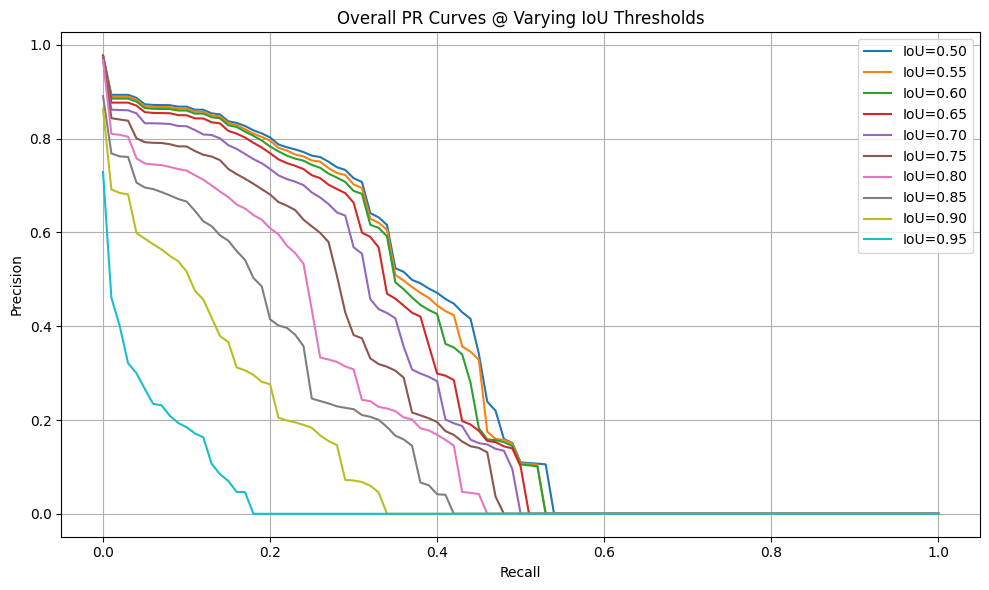

In [12]:
train_coco_pred = train_coco_gt.loadRes(train_save_path)
summarise_and_plot_metrics(train_coco_gt, train_coco_pred, "train_metrics")


--- Evaluating on validation set ---


Running inference:   0%|          | 0/76 [00:00<?, ?it/s]

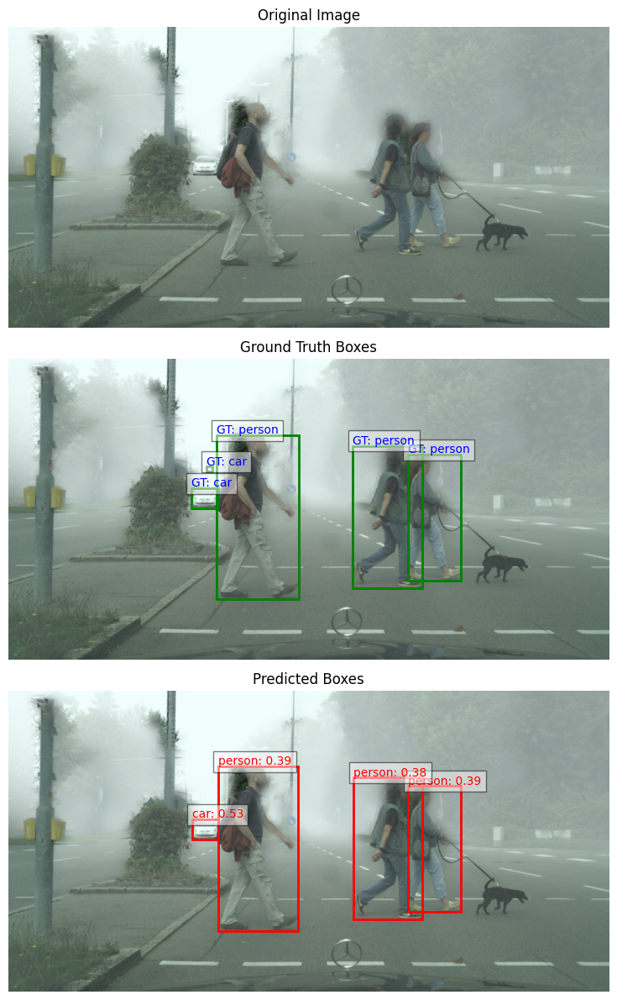

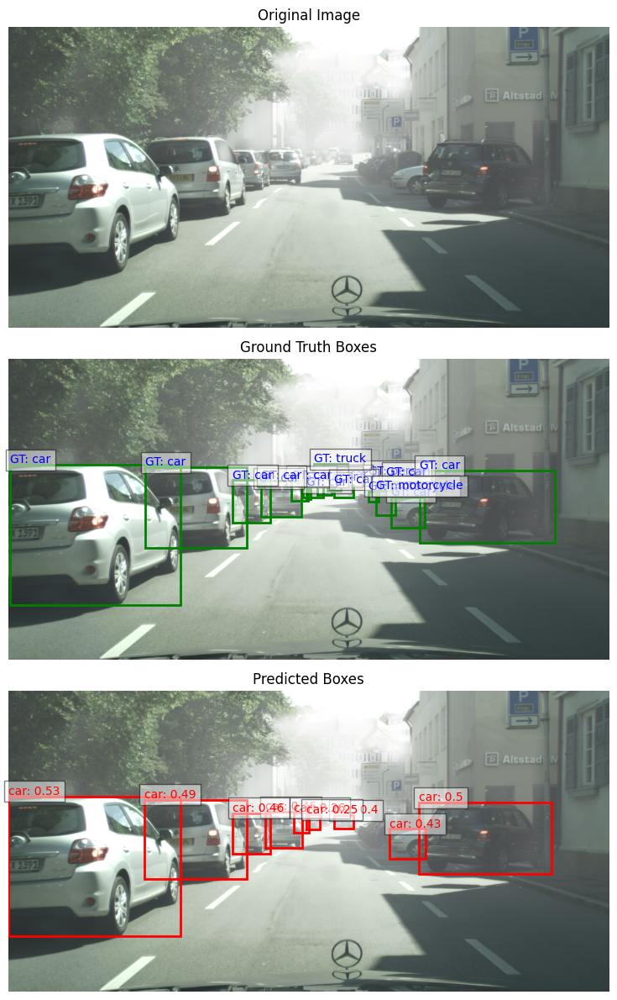

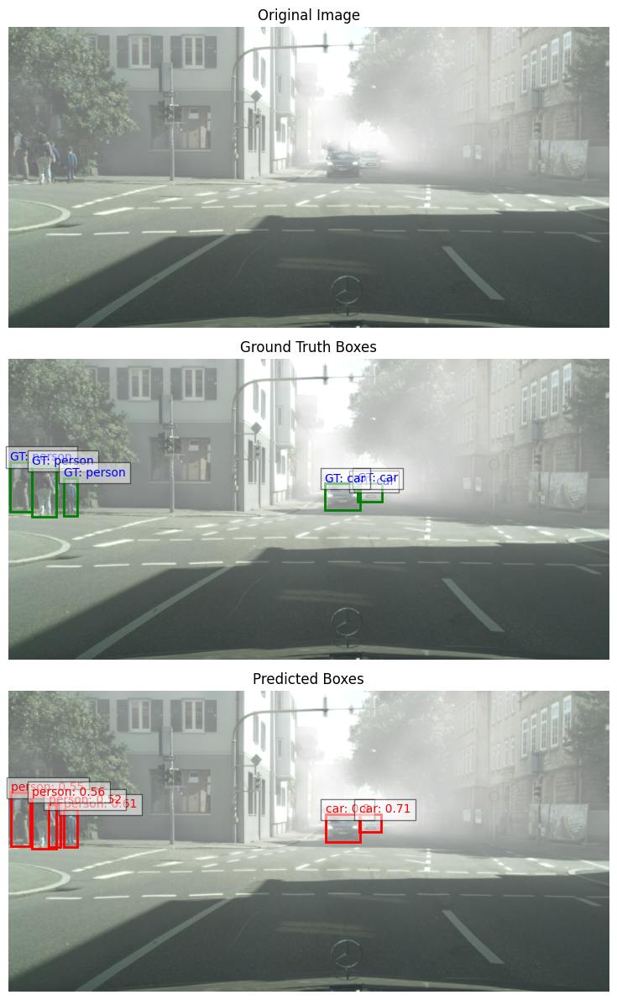

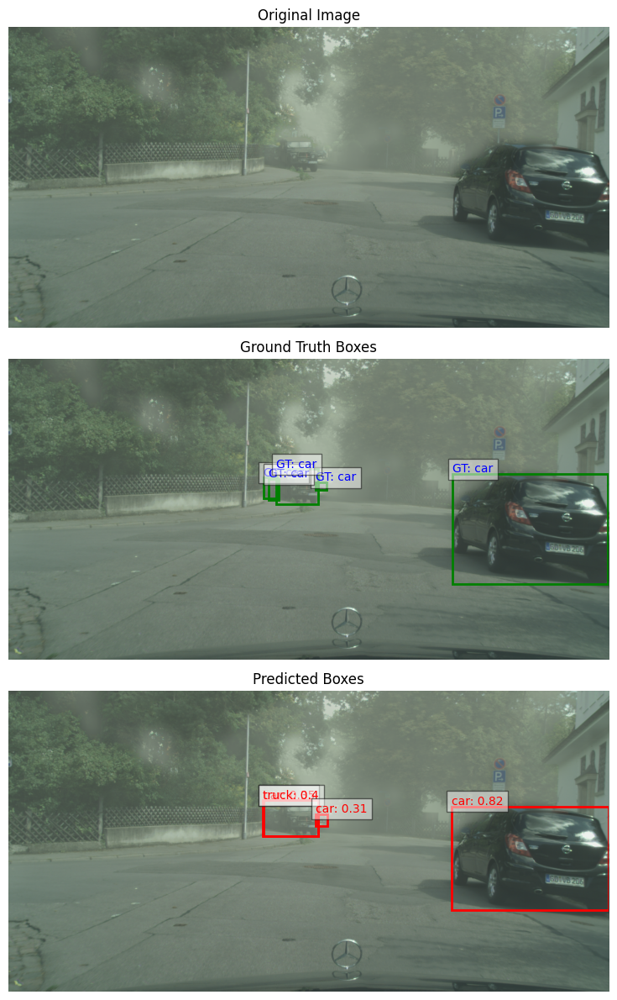

Running inference: 100%|██████████| 76/76 [05:21<00:00,  4.23s/it]


In [13]:
print("\n--- Evaluating on validation set ---")
val_save_path = "val_predictions.json"
model.eval()
with torch.no_grad():
    val_eval = inference(model, val_loader, processor, id_to_cat, val_save_path)

Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.80s).
Accumulating evaluation results...
DONE (t=0.21s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.231
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.326
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.249
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.202
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.331
 Average Recall     (AR) @[ IoU=0.5

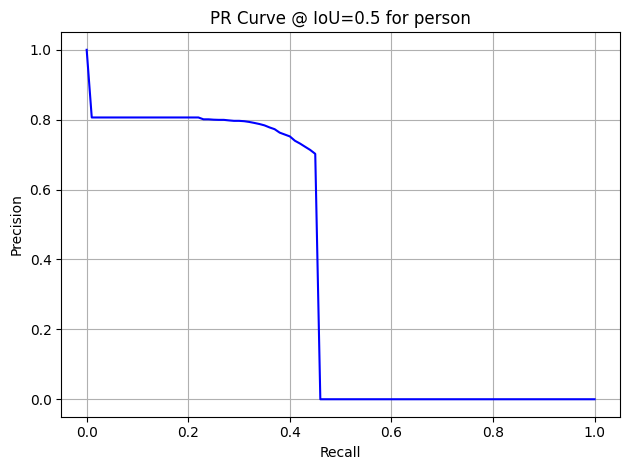

car                  | AP@0.5: 0.523 | AP@0.75: 0.447 | mAP@[.5:.95]: 0.405


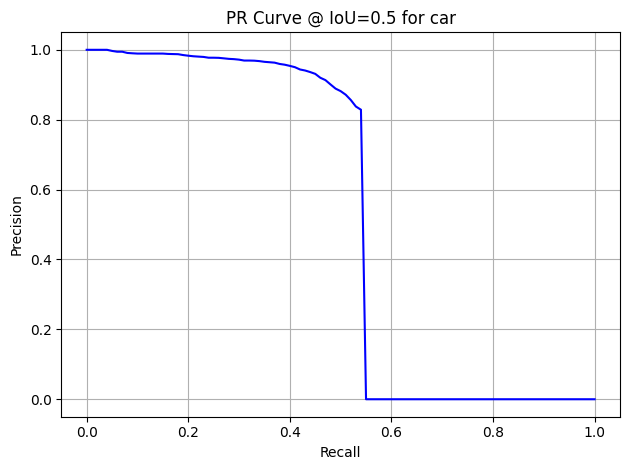

train                | AP@0.5: 0.188 | AP@0.75: 0.132 | mAP@[.5:.95]: 0.141


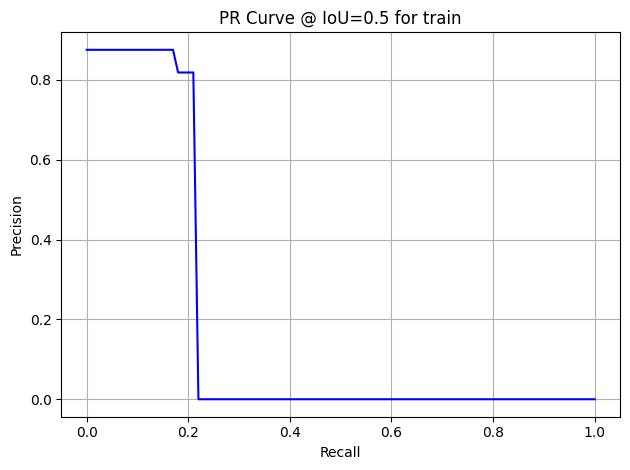

rider                | AP@0.5: 0.174 | AP@0.75: 0.131 | mAP@[.5:.95]: 0.116


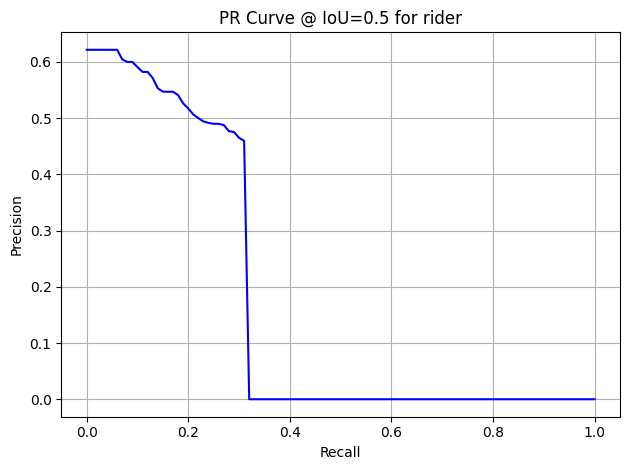

truck                | AP@0.5: 0.216 | AP@0.75: 0.186 | mAP@[.5:.95]: 0.168


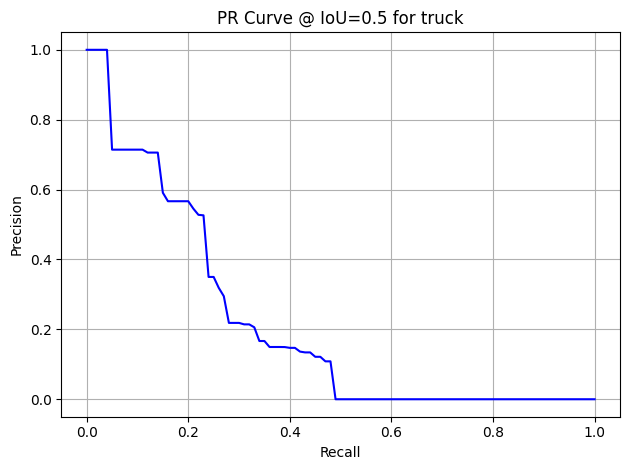

motorcycle           | AP@0.5: 0.351 | AP@0.75: 0.214 | mAP@[.5:.95]: 0.219


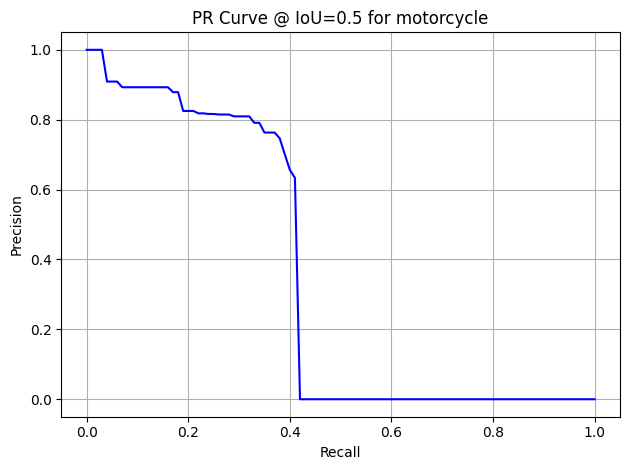

bicycle              | AP@0.5: 0.372 | AP@0.75: 0.209 | mAP@[.5:.95]: 0.204


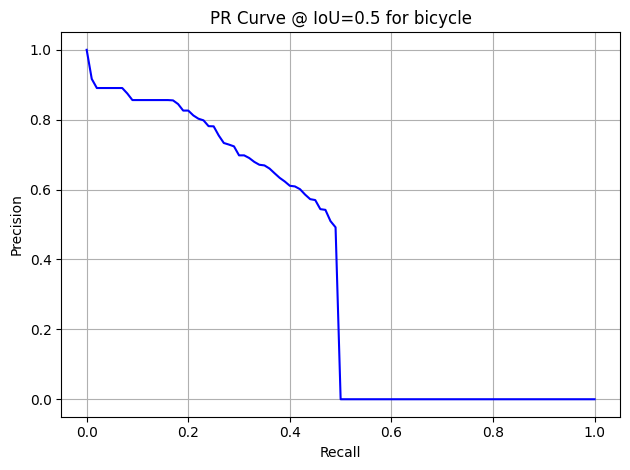

bus                  | AP@0.5: 0.421 | AP@0.75: 0.414 | mAP@[.5:.95]: 0.362


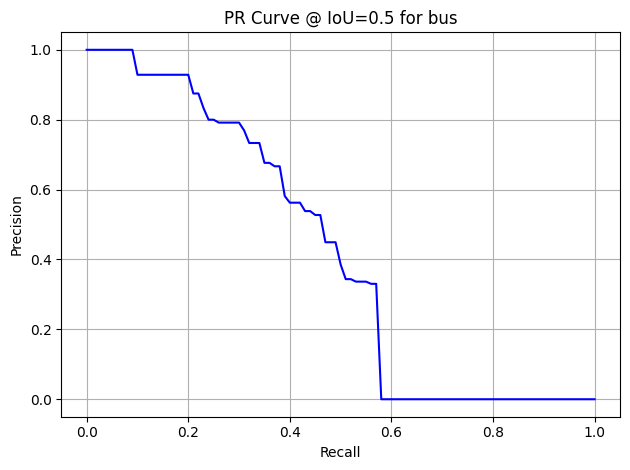

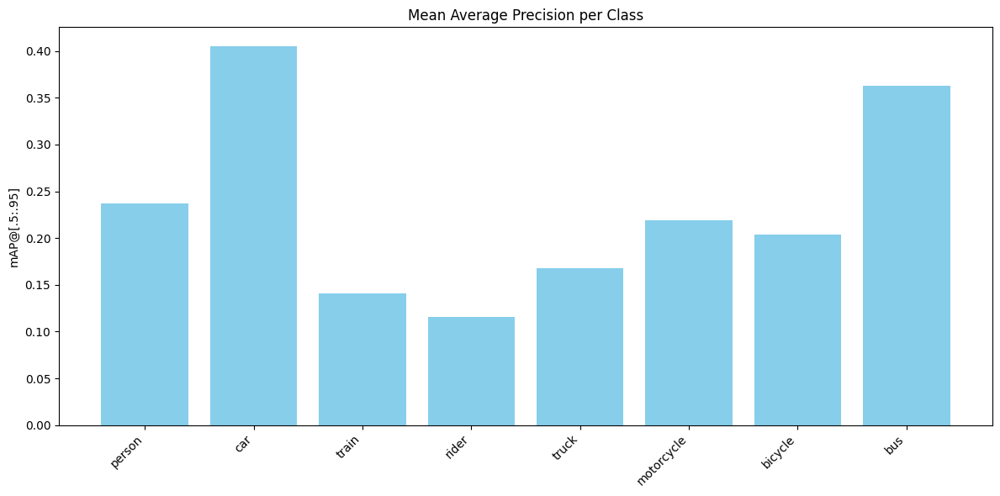

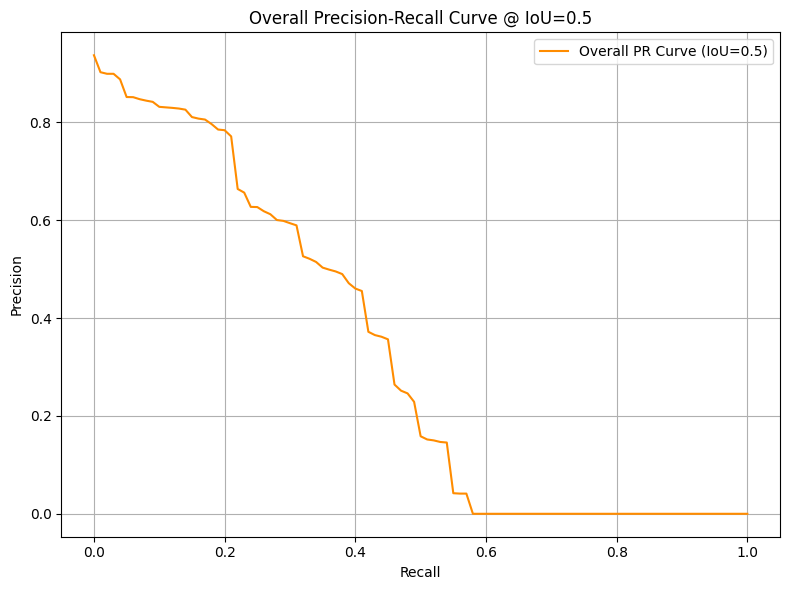

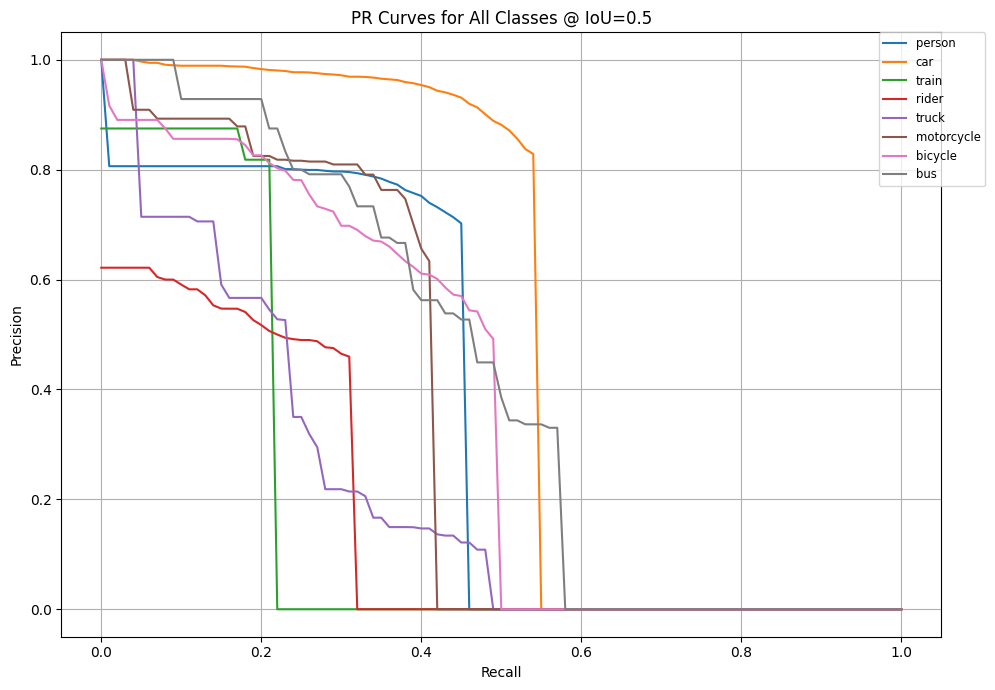

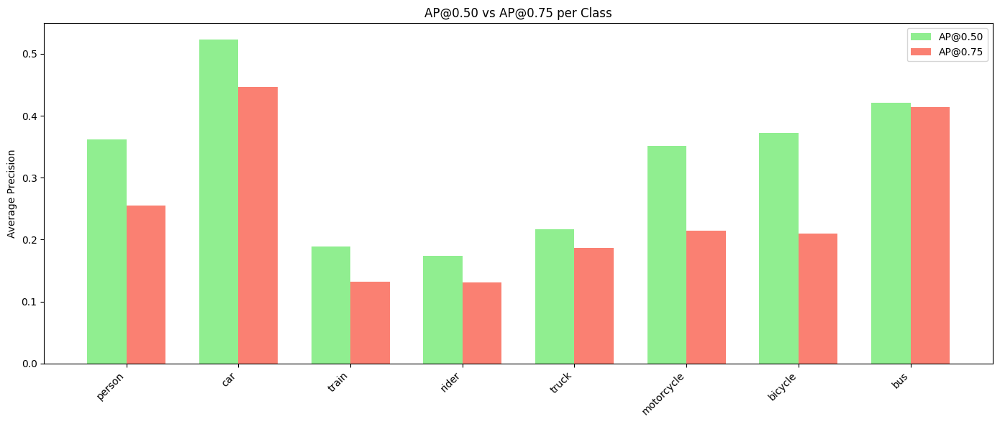

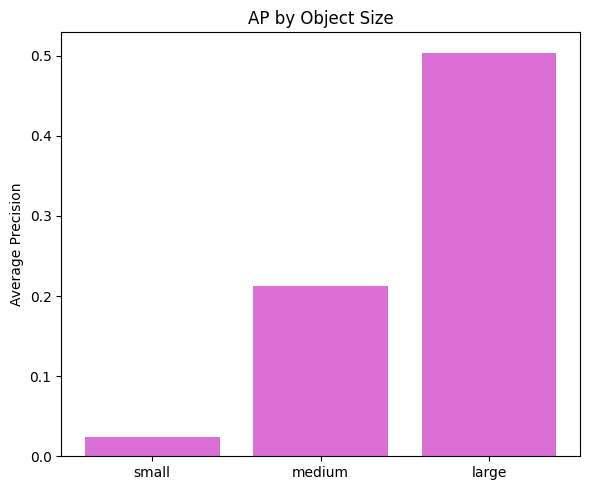

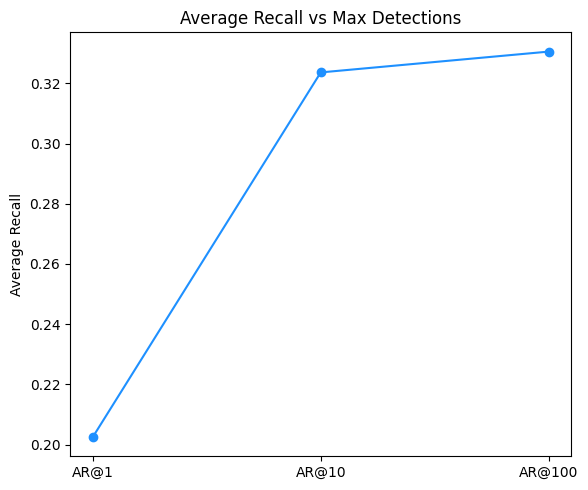


### Overall PR Curves at Multiple IoU Thresholds ###


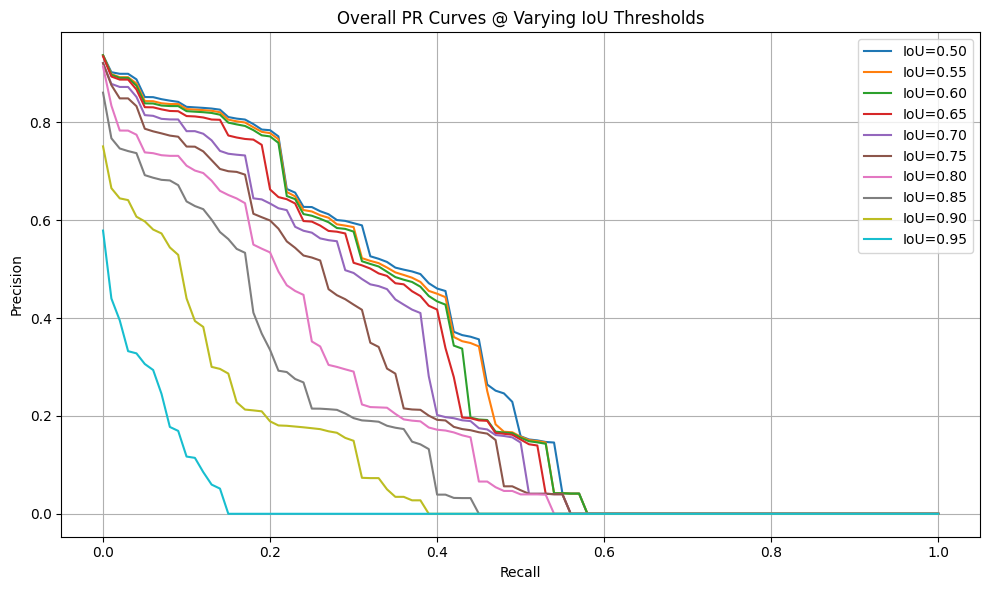

In [14]:
val_coco_pred = val_coco_gt.loadRes(val_save_path)
summarise_and_plot_metrics(val_coco_gt, val_coco_pred, "val_metrics")

In [15]:
print(model)

GroundingDinoForObjectDetection(
  (model): GroundingDinoModel(
    (backbone): GroundingDinoConvModel(
      (conv_encoder): GroundingDinoConvEncoder(
        (model): SwinBackbone(
          (embeddings): SwinEmbeddings(
            (patch_embeddings): SwinPatchEmbeddings(
              (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
            )
            (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (encoder): SwinEncoder(
            (layers): ModuleList(
              (0): SwinStage(
                (blocks): ModuleList(
                  (0): SwinLayer(
                    (layernorm_before): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
                    (attention): SwinAttention(
                      (self): SwinSelfAttention(
                        (query): Linear(in_features=128, out_features=128, bias=True)
                        (key): Linear(in_featu